## Punto 1

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

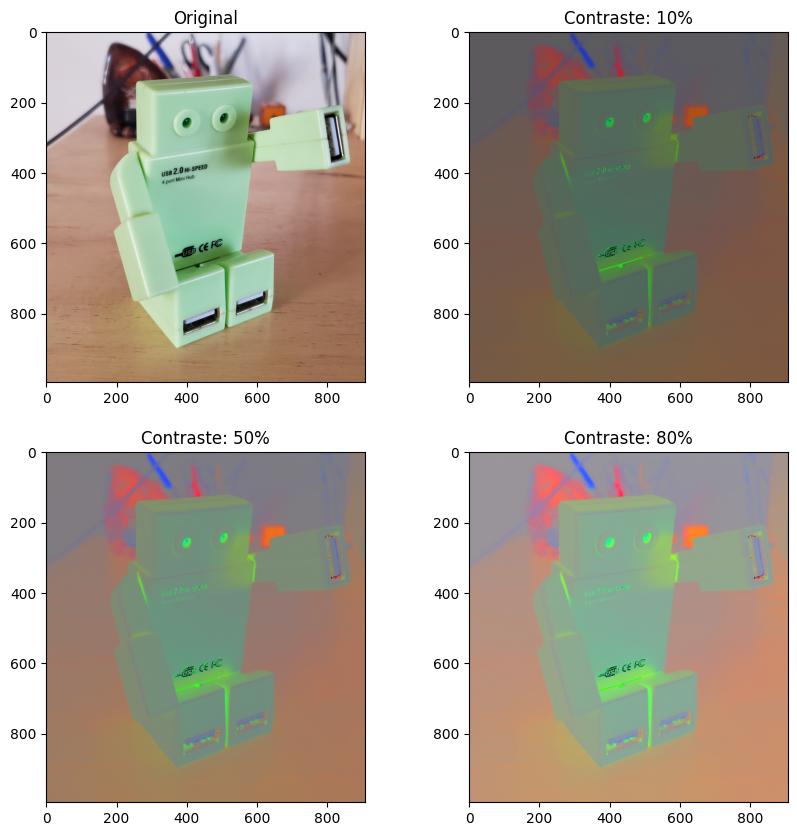

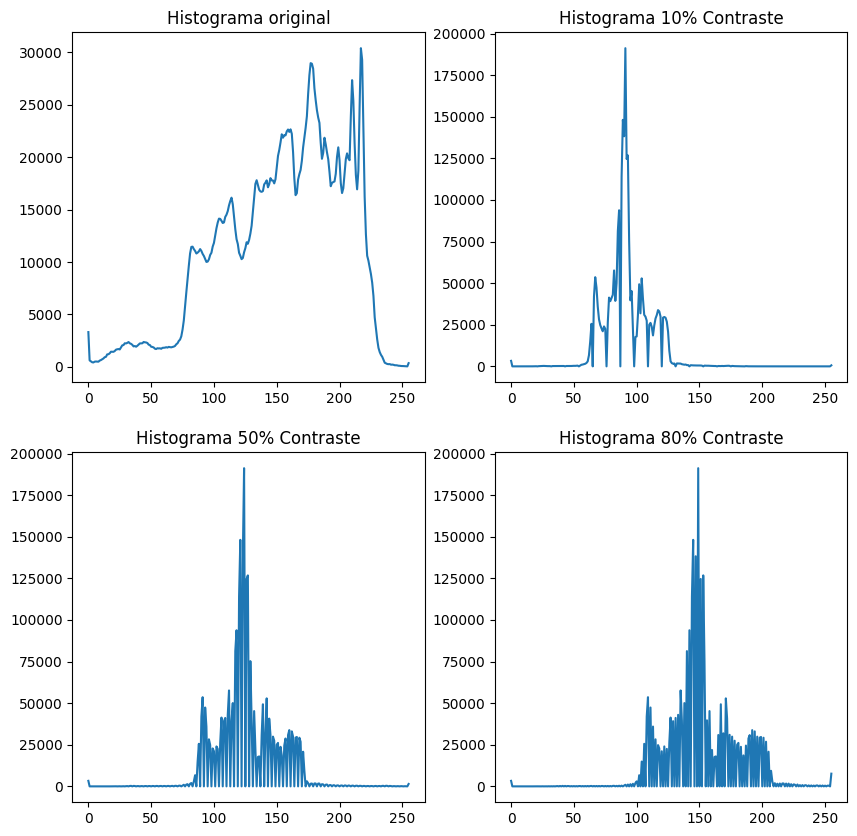

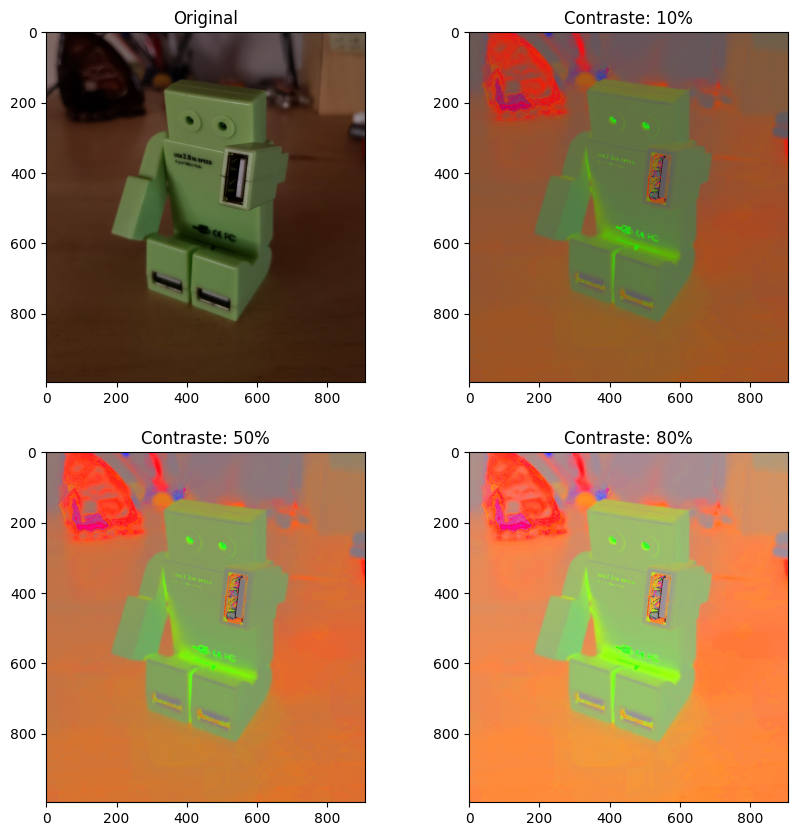

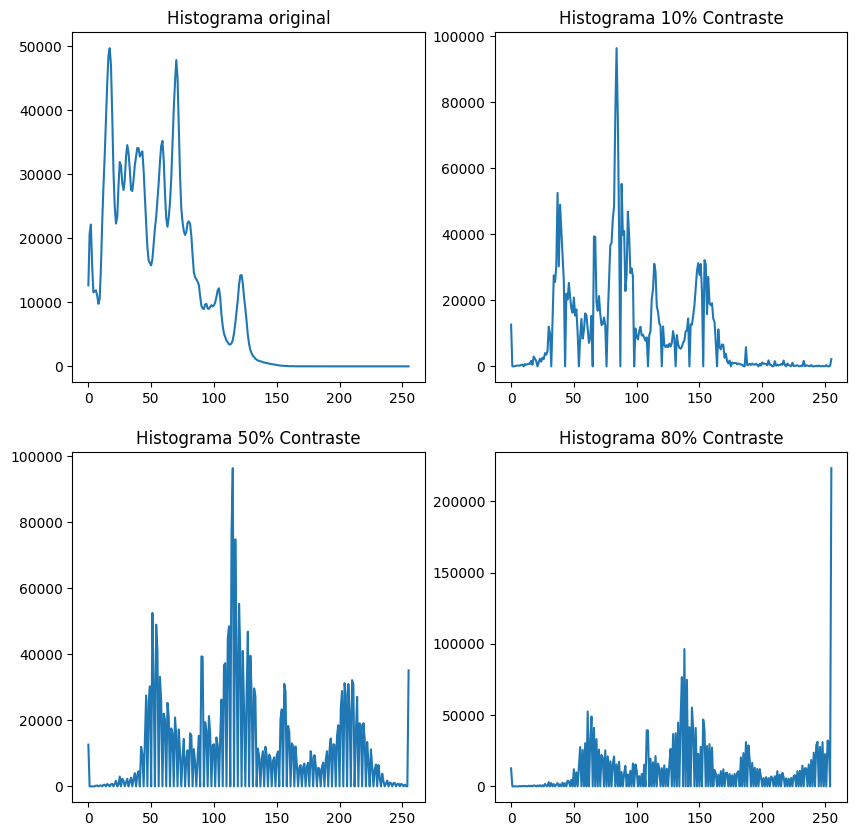

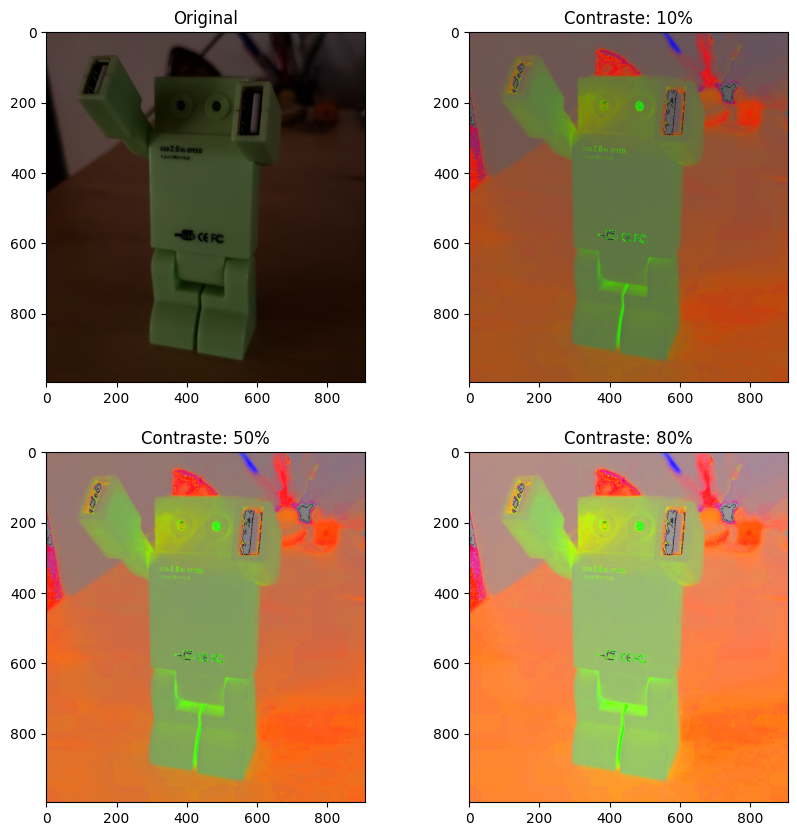

...

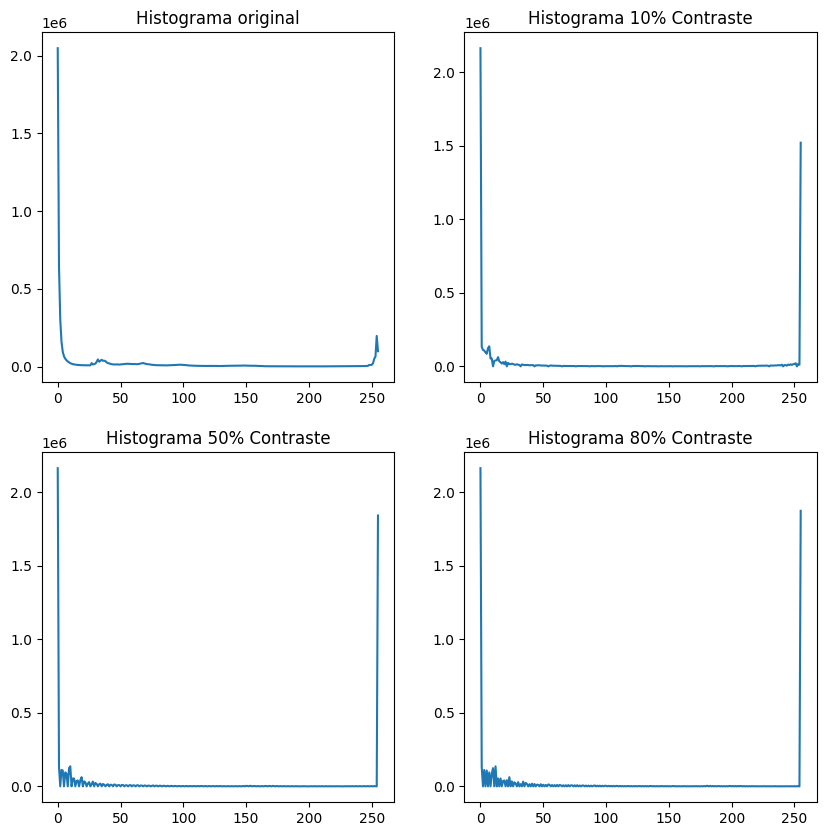

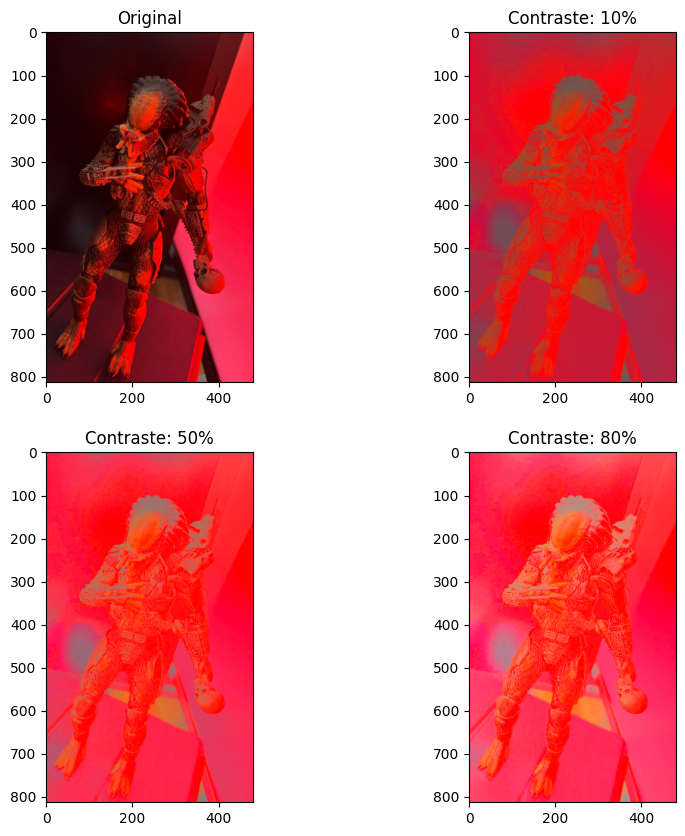

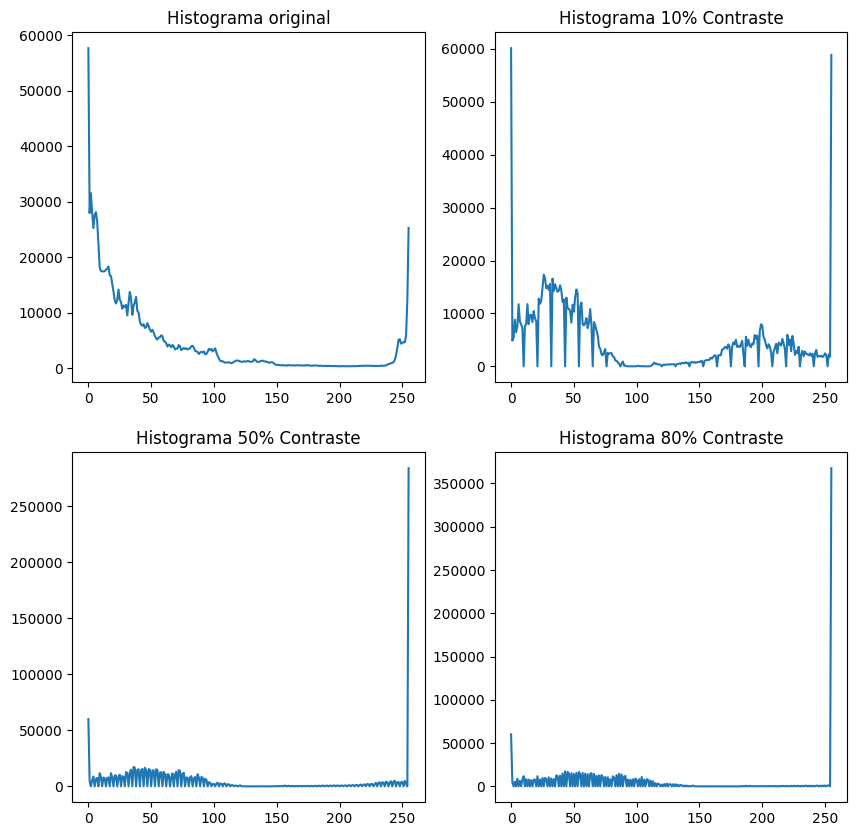

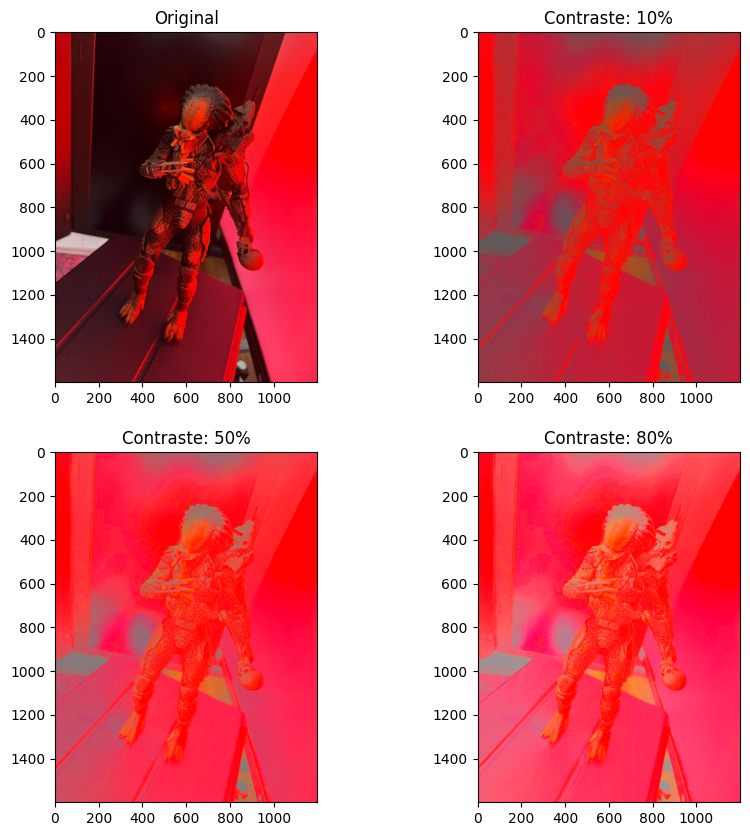

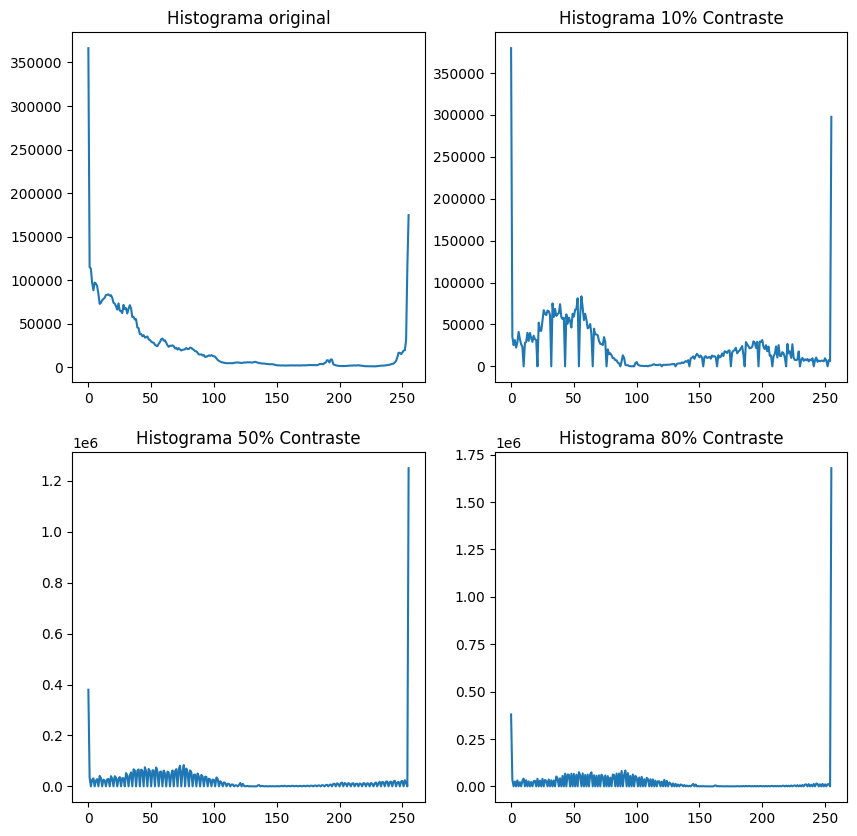

In [2]:
def chromatic_coordinates(image: np.ndarray) -> np.ndarray:
    """
    Conversion de una imagen a coordenadas cromaticas.
    
    Parameters
    ----------
    imagen: np.ndarray
        Input (BGR o en escala de grises).
    
    Returns
    -------
    chromatic_image: np.ndarray
        Imagen con coordenadas cromaticas aplicadas.
    """
    image_float = image.astype(np.float32)
    sum_channels = np.sum(image_float, axis=2, keepdims=True)
    chromatic_image = np.divide(image_float, sum_channels, where=sum_channels != 0)
    chromatic_image = (chromatic_image * 255).clip(0, 255).astype(np.uint8)
    
    return chromatic_image

# Función actualizada para aplicar coordenadas cromaticas y contraste
def change_contrast_chromatic(input_image: np.ndarray, contrast: int) -> np.ndarray:
    """
    Conversion de una imagen a coordenadas cromaticas seguido de ajuste por contraste.
    
    Parameters
    ----------
    input_image: np.ndarray
        Imagen en escala de grises o BGR para modificar.
        
    contrast: int
        Porcentaje de contraste a aplicar
    
    Returns
    -------
    img_new: np.ndarray
        Imagen con coordenadas cromaticas y contraste aplicados.
    """
    
    chromatic_img = chromatic_coordinates(input_image)
    
    
    img_new = (1 + contrast / 100) * chromatic_img
    np.clip(img_new, 0, 255, out=img_new)
    img_new = img_new.astype('uint8')
    
    return img_new

# File paths 
img_paths = ['coord_cromaticas/CoordCrom_1.png', 
             'coord_cromaticas/CoordCrom_2.png', 
             'coord_cromaticas/CoordCrom_3.png', 
             'white_patch/test_blue.png', 
             'white_patch/test_green.png', 
             'white_patch/test_red.png', 
             'white_patch/wp_blue.jpg', 
             'white_patch/wp_green.png', 
             'white_patch/wp_green2.jpg', 
             'white_patch/wp_red.png', 
             'white_patch/wp_red2.jpg']

# Loop sobre todas las imagenes aplicando coordenadas cromaticas y contraste
for image_path in img_paths:
    img = cv.imread(image_path)  
    
    
    fig = plt.figure(figsize=(10, 10))

    # Imagen original 
    ax1 = plt.subplot(221)
    ax1.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax1.set_title('Original')

    hist1, bins1 = np.histogram(img.ravel(), 256, [0, 256])

    
    new_contrast = 10
    img_mod_10 = change_contrast_chromatic(input_image=img, contrast=new_contrast)

    ax2 = plt.subplot(222)
    ax2.imshow(cv.cvtColor(img_mod_10, cv.COLOR_BGR2RGB))
    ax2.set_title(f'Contraste: {new_contrast}%')

    hist2, bins2 = np.histogram(img_mod_10.ravel(), 256, [0, 256])

    
    new_contrast = 50
    img_mod_50 = change_contrast_chromatic(input_image=img, contrast=new_contrast)

    ax3 = plt.subplot(223)
    ax3.imshow(cv.cvtColor(img_mod_50, cv.COLOR_BGR2RGB))
    ax3.set_title(f'Contraste: {new_contrast}%')

    hist3, bins3 = np.histogram(img_mod_50.ravel(), 256, [0, 256])

    
    new_contrast = 80
    img_mod_80 = change_contrast_chromatic(input_image=img, contrast=new_contrast)

    ax4 = plt.subplot(224)
    ax4.imshow(cv.cvtColor(img_mod_80, cv.COLOR_BGR2RGB))
    ax4.set_title(f'Contraste: {new_contrast}%')

    hist4, bins4 = np.histogram(img_mod_80.ravel(), 256, [0, 256])

    plt.show()

    
    fig = plt.figure(figsize=(10, 10))

    # Histogramas de las imagenes
    plt.subplot(221), plt.plot(hist1), plt.title('Histograma original')
    plt.subplot(222), plt.plot(hist2), plt.title('Histograma 10% Contraste')
    plt.subplot(223), plt.plot(hist3), plt.title('Histograma 50% Contraste')
    plt.subplot(224), plt.plot(hist4), plt.title('Histograma 80% Contraste')

    plt.show()

## Punto 2

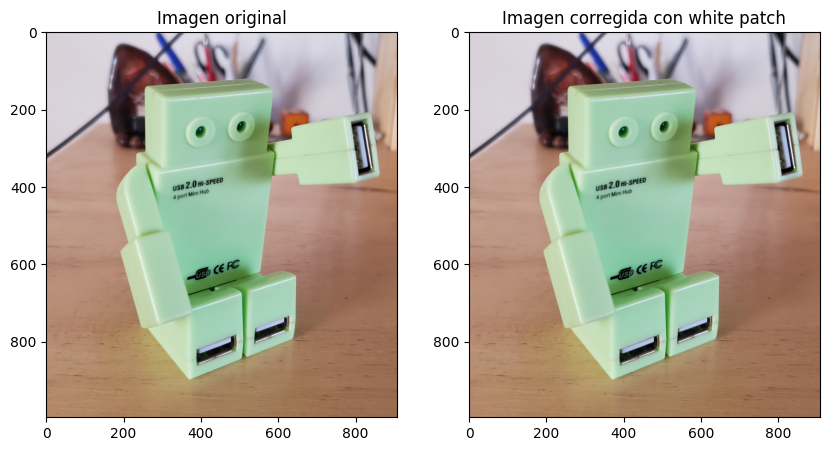

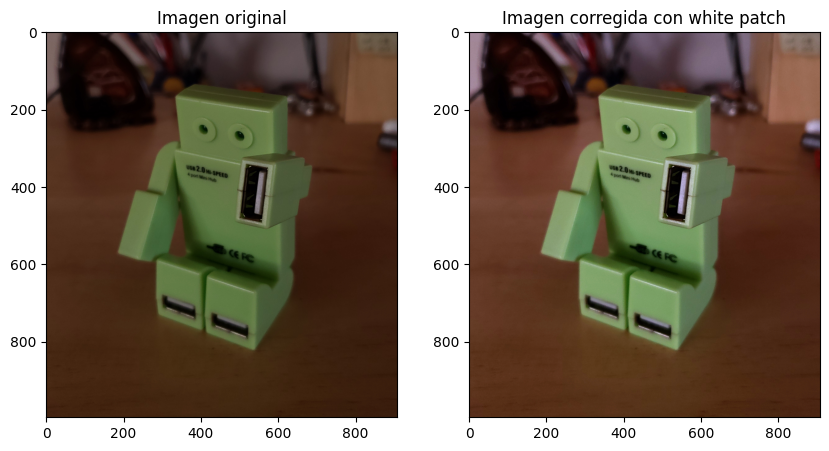

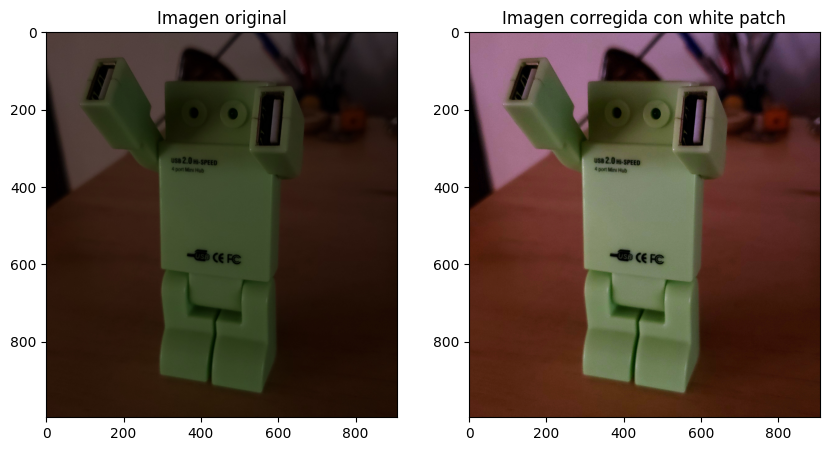

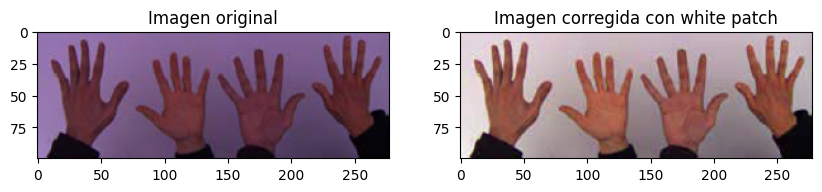

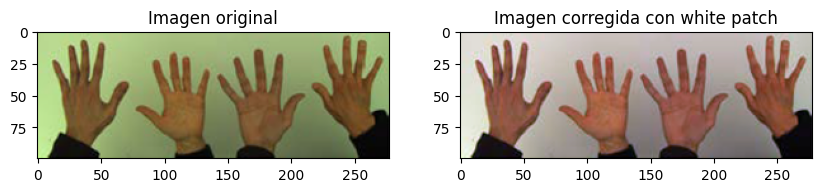

...

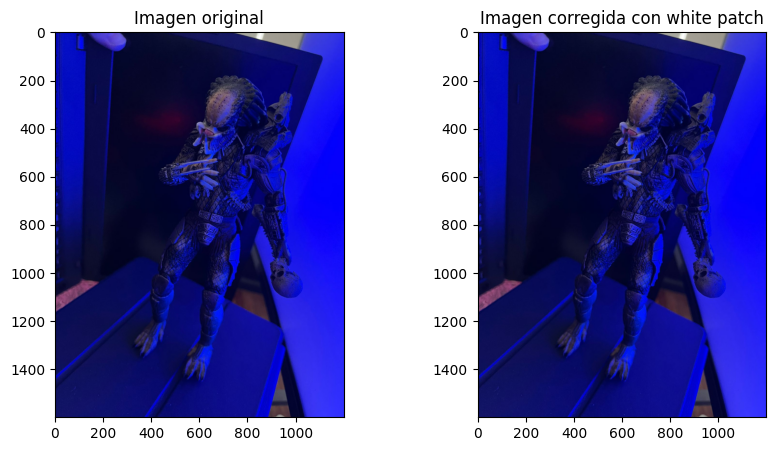

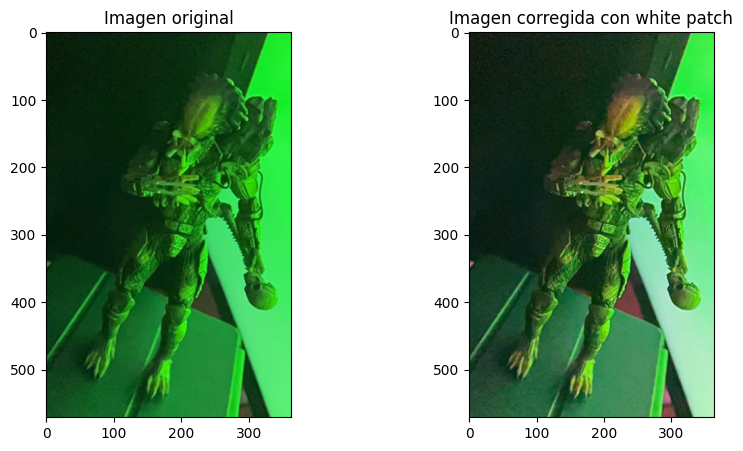

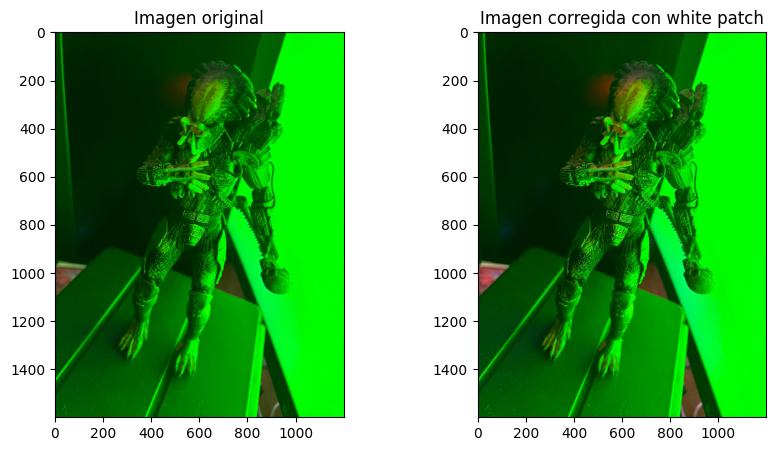

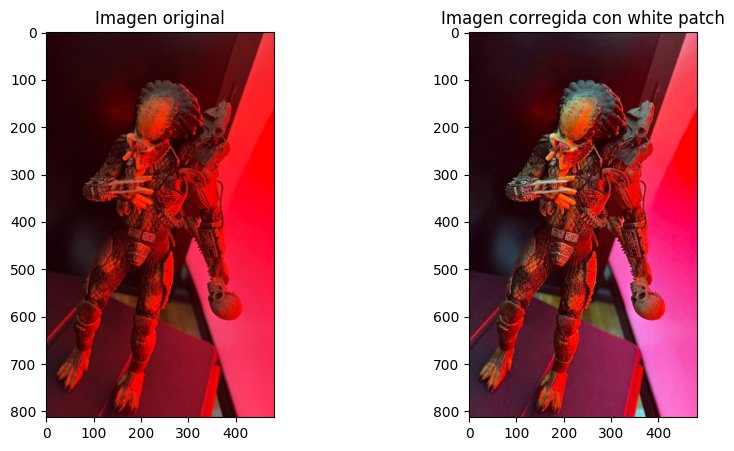

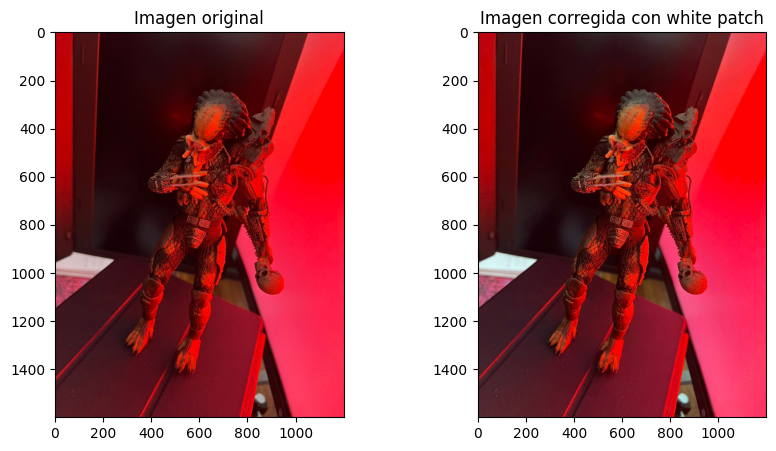

In [3]:

# Implementacion del algoritmo white patch para corrección de iluminacion de colores
def white_patch_correction(input_image: np.ndarray) -> np.ndarray:
    """
    Applica el algoritmo white patch para corrección de iluminacion de colores.
    
    Parameters
    ----------
    input_image: np.ndarray
        Input en formato BGR.
    
    Returns
    -------
    corrected_image: np.ndarray
        La imagen despues de aplicar el algoritmo White Patch.
    """
    # Conversion de imagen a float32 
    img_float = input_image.astype(np.float32)
    
    # Encontrar el maximo de cada canal
    max_val_per_channel = np.max(img_float, axis=(0, 1))

    
    corrected_image = img_float / max_val_per_channel

    
    corrected_image = (corrected_image * 255).clip(0, 255).astype('uint8')

    return corrected_image

img_paths = ['coord_cromaticas/CoordCrom_1.png', 
             'coord_cromaticas/CoordCrom_2.png', 
             'coord_cromaticas/CoordCrom_3.png', 
             'white_patch/test_blue.png', 
             'white_patch/test_green.png', 
             'white_patch/test_red.png', 
             'white_patch/wp_blue.jpg', 
             'white_patch/wp_green.png', 
             'white_patch/wp_green2.jpg', 
             'white_patch/wp_red.png', 
             'white_patch/wp_red2.jpg']



for image in img_paths:
    original_image = cv.imread(image)

   
    white_patch_image = white_patch_correction(original_image)

    # Visualizar las imagenes
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
    plt.title("Imagen original")

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(white_patch_image, cv.COLOR_BGR2RGB))
    plt.title("Imagen corregida con white patch")
    plt.show()

## Punto 3

Resultados Obtenidos:

Se toma como ejemplo la imagen wp_blue.jpg:
Imagen Original: A imagen original (a la izquierda) muestra una fuerte tonalidad azul, probablemente debido a una fuente de luz que domina ese espectro, lo que crea una falta de equilibrio de color.
Imagen Corregida: Después de aplicar el algoritmo de white patch, el algoritmo intenta ajustar los canales de color basándose en el punto más brillante, asumiendo que ese punto debería ser blanco. Como resultado, la tonalidad azul dominante se ha suavizado y los colores parecen más equilibrados. De esta manera, se pueden observar algunos puntos con colores como el gris en las garras de la mano derecha.


Posible falla: El White Patch parte del supuesto de que el punto más brillante de la imagen debe ser blanco. De todas formas, esto puede no ser cierto en todas las imágenes. En el caso de esta imagen, si no hay una fuente de luz blanca o un objeto blanco en la escena, el algoritmo podría no corregir completamente la iluminación.


Posible falla: Si la luz ambiental en la escena tiene un color dominante (como luz azulada), el White Patch puede sobrecompensar y generar una imagen con colores irreales o subrepresentar otros tonos.

¿Donde puede verse? La corrección ha reducido la influencia del color azul, pero no ha eliminado completamente la tonalidad, lo que podría deberse a la naturaleza de la fuente de luz en la escena.


## Punto 1

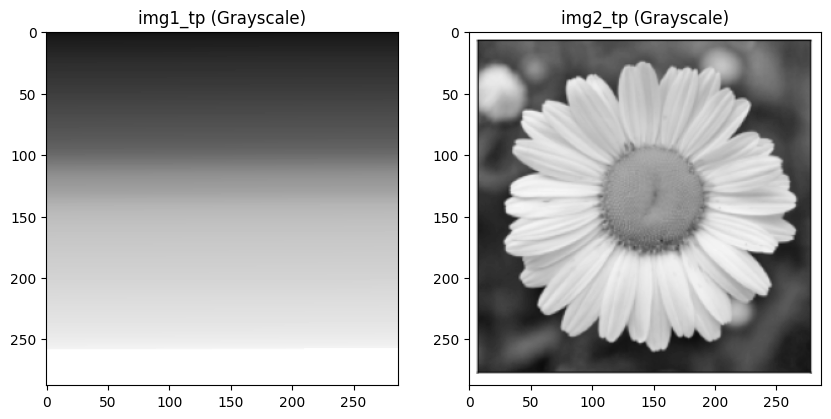

In [4]:
img1_path = 'img1_tp.png'
img2_path = 'img2_tp.png'

#Ver las imagenes en escala de grises
img1 = cv.imread(img1_path, cv.IMREAD_GRAYSCALE)
img2 = cv.imread(img2_path, cv.IMREAD_GRAYSCALE)


plt.figure(figsize=(10, 5))


plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray', vmin=0, vmax=255)
plt.title("img1_tp (Grayscale)")

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
plt.title("img2_tp (Grayscale)")

plt.show()

Al tratarse de imagenes en escala de grises, se decide utilizar 256 bins para el histograma, ya que los valores de intensidad van de 0 a 255.

De este modo, cada bin representará un nivel de intensidad diferente, cubriendo todos los valores posibles.

## Punto 2

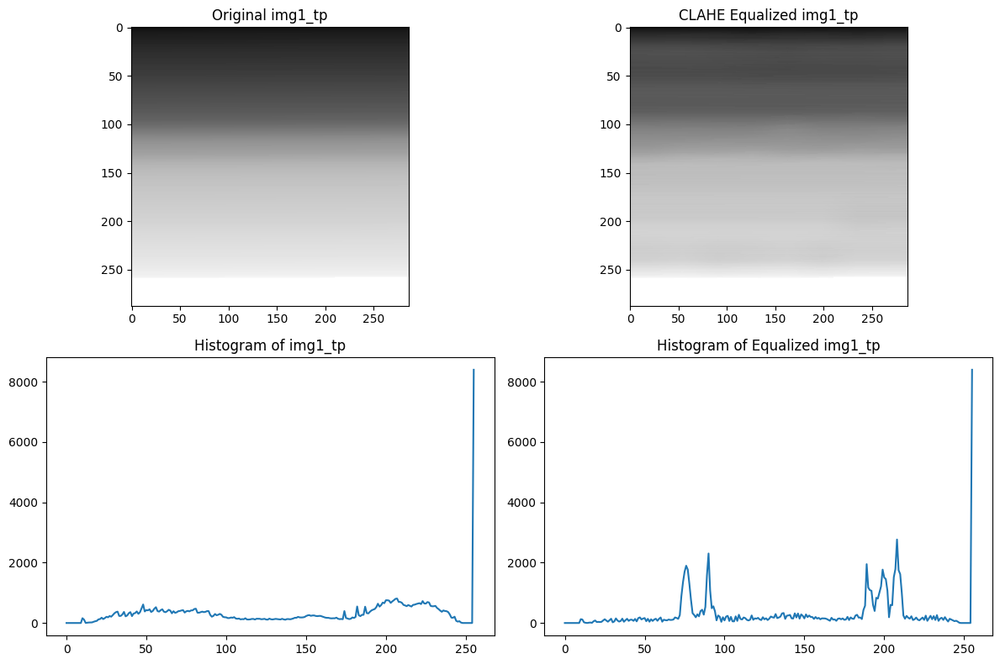

In [5]:
img1_path = 'img1_tp.png'
img2_path = 'img2_tp.png'

# Reading the images in grayscale mode
img1 = cv.imread(img1_path, cv.IMREAD_GRAYSCALE)
img2 = cv.imread(img2_path, cv.IMREAD_GRAYSCALE)

# Create figure for visualization
fig = plt.figure(figsize=(12, 8))

# Display original img1
ax1 = plt.subplot(221)
ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title('Original img1_tp')

# Compute and plot the histogram for img1
hist1, bins1 = np.histogram(img1.ravel(), 256, [0, 256])
ax3 = plt.subplot(223)
ax3.plot(hist1)
ax3.set_title('Histogram of img1_tp')

# Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to img1
clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img1_eqzd = clahe.apply(img1)

# Display equalized img1
ax2 = plt.subplot(222)
ax2.imshow(img1_eqzd, cmap='gray', vmin=0, vmax=255)
ax2.set_title('CLAHE Equalized img1_tp')

# Compute and plot the histogram for the equalized image
hist2, bins2 = np.histogram(img1_eqzd.ravel(), 256, [0, 256])
ax4 = plt.subplot(224)
ax4.plot(hist2)
ax4.set_title('Histogram of Equalized img1_tp')

plt.tight_layout()
plt.show()

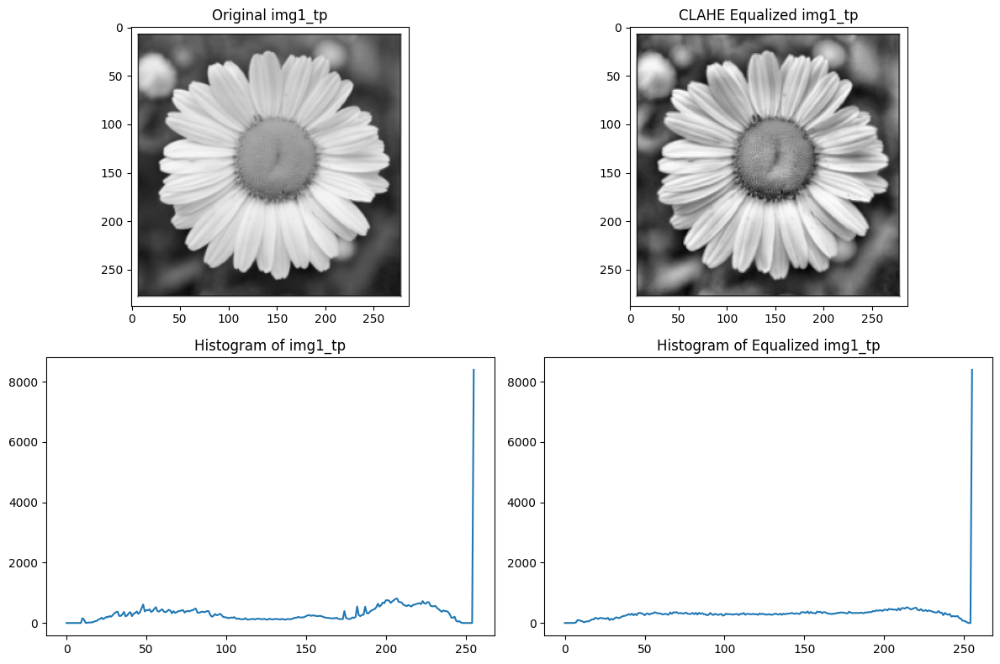

In [6]:
img1_path = 'img1_tp.png'
img2_path = 'img2_tp.png'

# Reading the images in grayscale mode
img1 = cv.imread(img1_path, cv.IMREAD_GRAYSCALE)
img2 = cv.imread(img2_path, cv.IMREAD_GRAYSCALE)

# Create figure for visualization
fig = plt.figure(figsize=(12, 8))

# Display original img1
ax1 = plt.subplot(221)
ax1.imshow(img2, cmap='gray', vmin=0, vmax=255)
ax1.set_title('Original img1_tp')

# Compute and plot the histogram for img1
hist1, bins1 = np.histogram(img2.ravel(), 256, [0, 256])
ax3 = plt.subplot(223)
ax3.plot(hist1)
ax3.set_title('Histogram of img1_tp')

# Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to img1
clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img2_eqzd = clahe.apply(img2)

# Display equalized img1
ax2 = plt.subplot(222)
ax2.imshow(img2_eqzd, cmap='gray', vmin=0, vmax=255)
ax2.set_title('CLAHE Equalized img1_tp')

# Compute and plot the histogram for the equalized image
hist2, bins2 = np.histogram(img2_eqzd.ravel(), 256, [0, 256])
ax4 = plt.subplot(224)
ax4.plot(hist2)
ax4.set_title('Histogram of Equalized img1_tp')

plt.tight_layout()
plt.show()

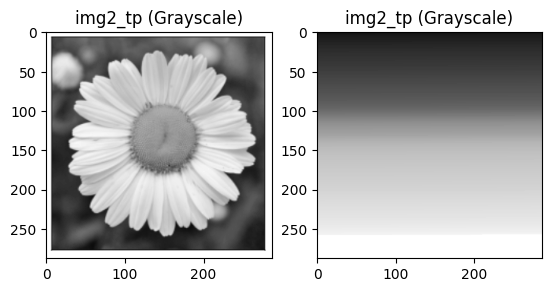

In [7]:
#Como fue creada la imagen 1?
pixeles = img2.flatten()
imagen = img2

# Ordenar los valores de los píxeles de manera creciente
pixeles_ordenados = np.sort(pixeles)

# Reformar el vector ordenado en la forma original de la imagen
imagen_ordenada = pixeles_ordenados.reshape(imagen.shape)


# Display img1
plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
plt.title("img2_tp (Grayscale)")

# Display img2
plt.subplot(1, 2, 2)
plt.imshow(imagen_ordenada, cmap='gray', vmin=0, vmax=255)
plt.title("img2_tp (Grayscale)")

plt.show()

## Punto 3

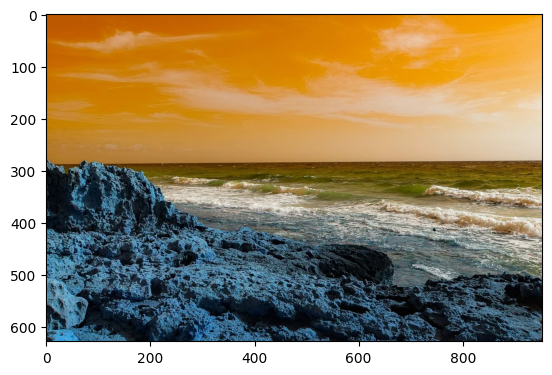

In [8]:
# Cargar una imagen en modo monocromático (un canal)
im_seg = cv.imread('segmentacion.png', cv.IMREAD_COLOR)
plt.imshow(im_seg)

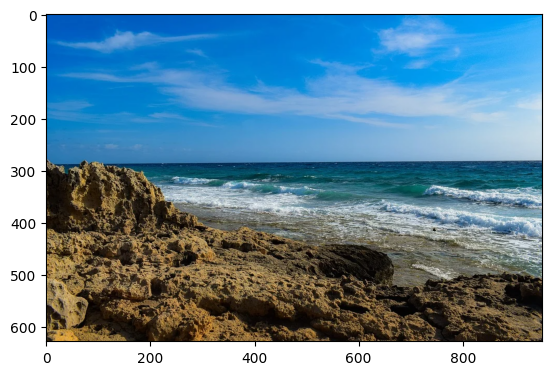

In [9]:
im_seg = cv.cvtColor(im_seg, cv.COLOR_BGR2RGB)
plt.imshow(im_seg)

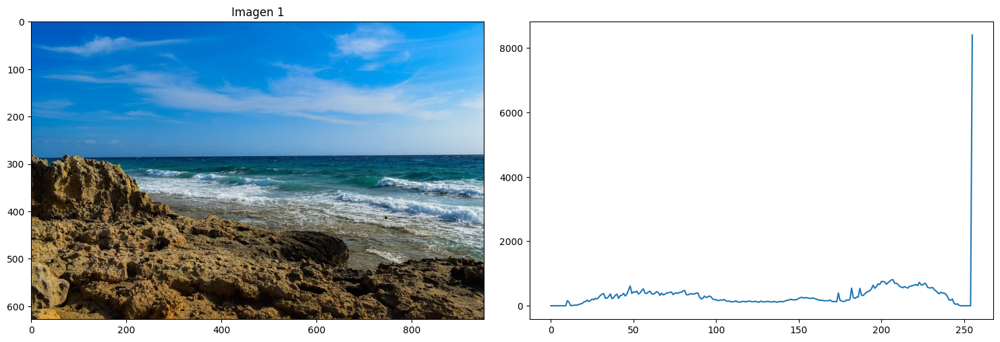

In [10]:
fig = plt.figure(figsize=(15, 5))

ax1=plt.subplot(121)
ax1.imshow(im_seg, vmin=0, vmax=255)
ax1.set_title('Imagen 1')

hist1,bins1 = np.histogram(img1.ravel(),256,[0,255])
ax3=plt.subplot(122)
ax3.plot(hist1)

plt.tight_layout()
plt.show()

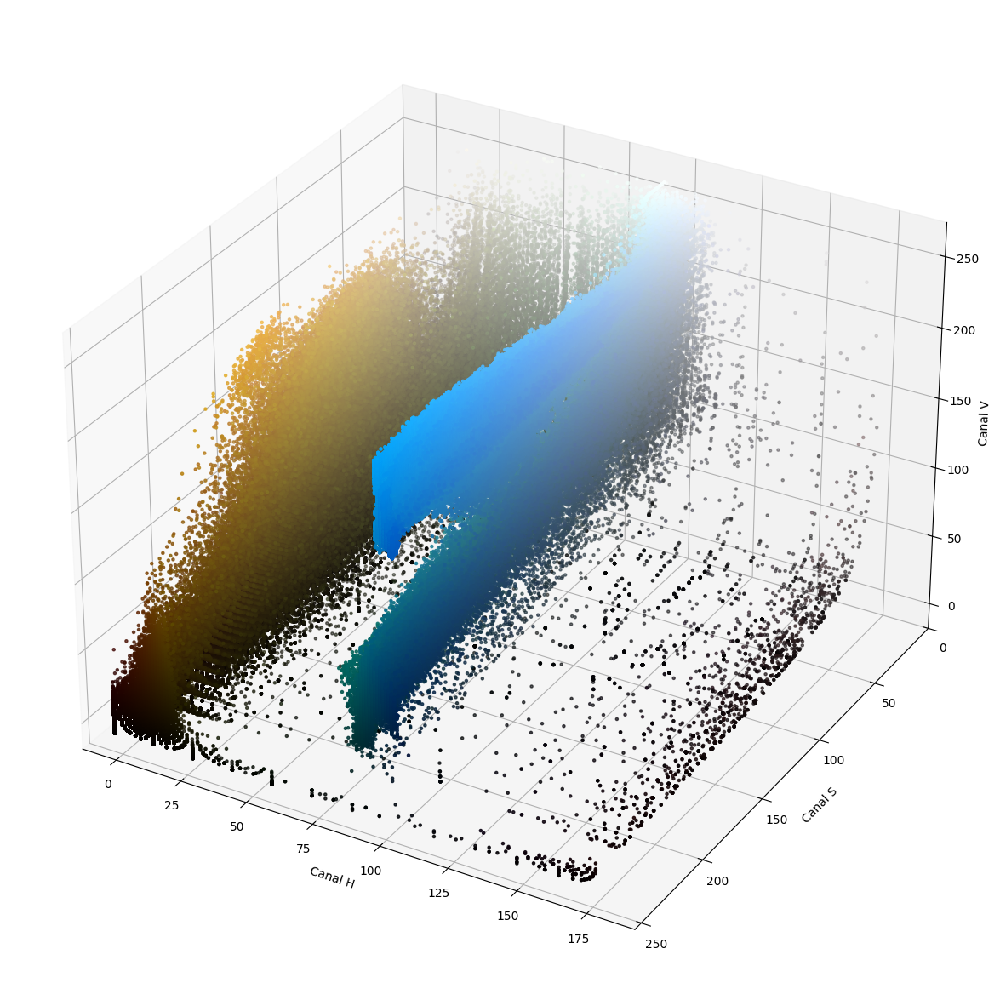

In [11]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

img_HSV = cv.cvtColor(im_seg, cv.COLOR_RGB2HSV)

c1, c2, c3 = cv.split(img_HSV)
#c1, c2, c3 = cv.split(im_seg)

fig = plt.figure(figsize=(15, 15))
axis = fig.add_subplot(1, 1, 1, projection="3d")

pixel_colors = im_seg.reshape((np.shape(im_seg)[0]*np.shape(im_seg)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

axis.scatter(c1.flatten(), c2.flatten(), c3.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Canal H")
axis.set_ylabel("Canal S")
axis.set_zlabel("Canal V")

# Invertir el eje Y para espejar sobre el canal 2 (Saturación)
axis.set_ylim(255, 0)

plt.show()

Puede verse que en HSV se pueden segmentar bien suelo, cielo y mar, utilizando el canal H.

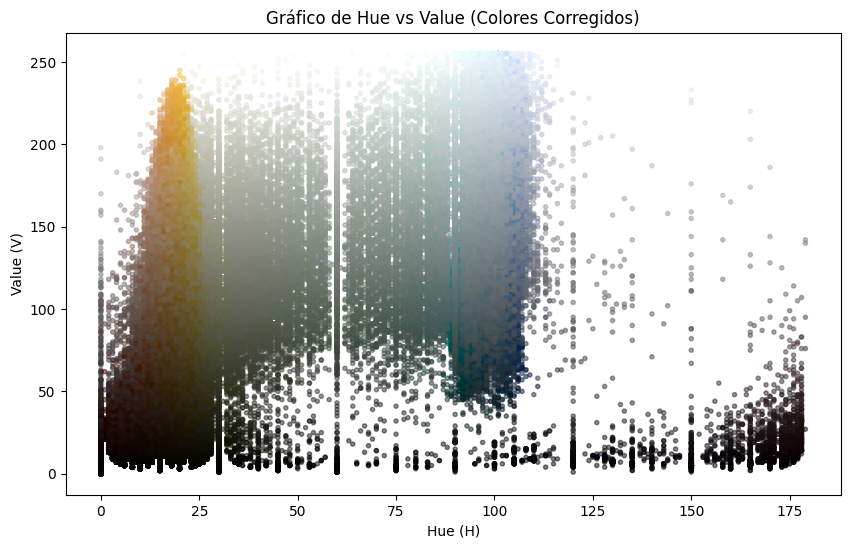

In [12]:
from matplotlib.colors import hsv_to_rgb

# Convertir la imagen de BGR a HSV
img_HSV = cv.cvtColor(im_seg, cv.COLOR_RGB2HSV)

# Dividir la imagen HSV en sus tres canales: H, S, V
H, S, V = cv.split(img_HSV)

# Normalizar H, S, y V a rangos [0, 1] para trabajar con matplotlib
H_normalized = H / 179.0  # Hue está en el rango [0, 179] en OpenCV
S_normalized = S / 255.0  # Saturation está en el rango [0, 255]
V_normalized = V / 255.0  # Value está en el rango [0, 255]

# Crear una matriz de colores HSV normalizados para todos los píxeles
hsv_normalized = np.stack((H_normalized, S_normalized, V_normalized), axis=-1)

# Convertir los valores de HSV a RGB para colorear los puntos en el gráfico
rgb_colors = hsv_to_rgb(hsv_normalized.reshape(-1, 3))

# Crear la figura y el subplot para el gráfico H contra V
fig, ax = plt.subplots(figsize=(10, 6))

# Crear el gráfico 2D para mostrar H contra V
ax.scatter(H.flatten(), V.flatten(), alpha=0.5, c=rgb_colors, marker=".")
ax.set_xlabel("Hue (H)")
ax.set_ylabel("Value (V)")
ax.set_title("Gráfico de Hue vs Value (Colores Corregidos)")

plt.show()

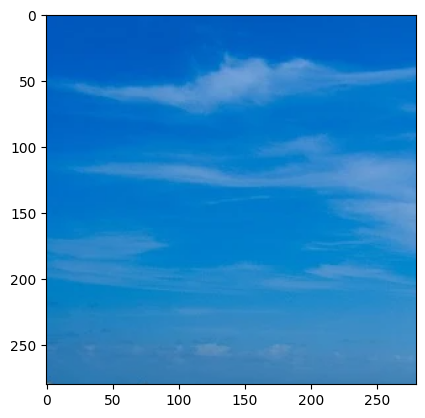

In [13]:
# Tomamos una muestra del cielo
sample = im_seg[0:280, 0:280,:]
plt.imshow(sample)
plt.show()

In [14]:
# Caracterizamos el color del suelo n el espacio RGB
color_mean, color_std = cv.meanStdDev(sample)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

[27.420242346938778, 125.08883928571429, 198.6948724489796]
[29.061880073571558, 16.338746764872123, 8.09536962852882]


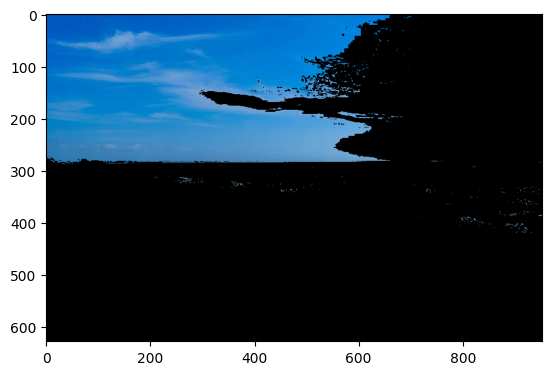

<function matplotlib.pyplot.show(close=None, block=None)>

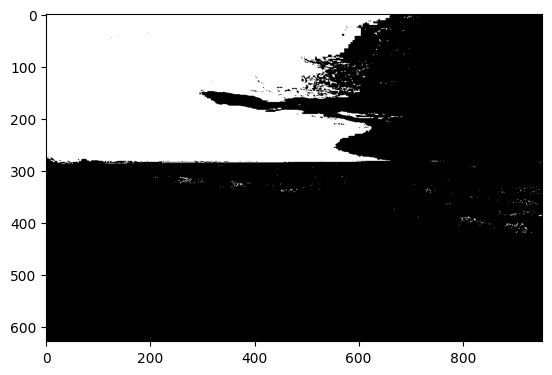

In [15]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 3 sigmas
n_sigma = 3
mask = cv.inRange(im_seg, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(im_seg, im_seg, mask=mask)

plt.figure(1)
plt.imshow(img_segmentada)
plt.show()

plt.figure(2)
plt.imshow(mask,cmap='gray')
plt.show

In [16]:
mask1 = mask.copy()

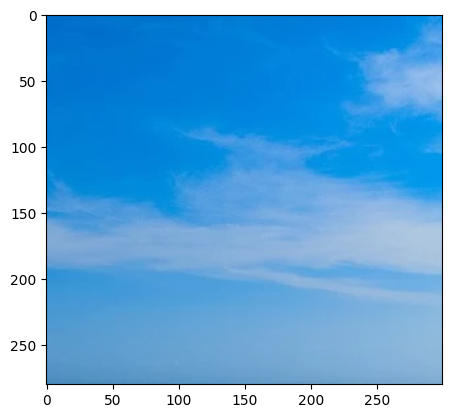

In [17]:
# Tomamos una muestra del cielo
sample = im_seg[0:280, 400:700,:]
plt.imshow(sample)
plt.show()

In [18]:
# Caracterizamos el color del suelo n el espacio RGB
color_mean, color_std = cv.meanStdDev(sample)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

[64.98035714285714, 153.19604761904762, 218.90288095238097]
[55.34458953094367, 20.778668516800295, 8.466957978778288]


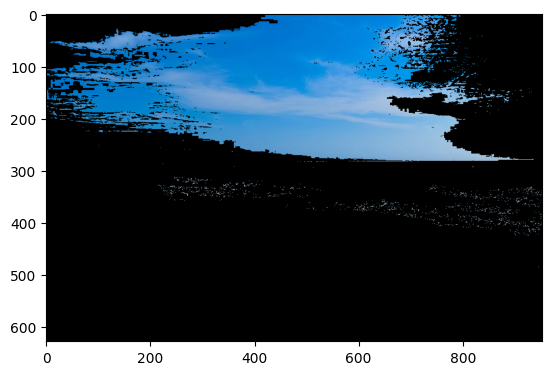

<function matplotlib.pyplot.show(close=None, block=None)>

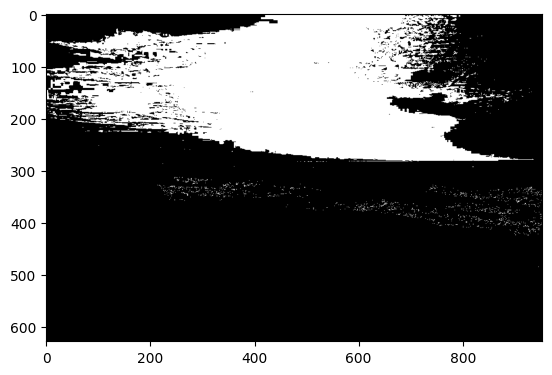

In [19]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 1.5 sigmas
n_sigma = 2
mask = cv.inRange(im_seg, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(im_seg, im_seg, mask=mask)

plt.figure(1)
plt.imshow(img_segmentada)
plt.show()

plt.figure(2)
plt.imshow(mask,cmap='gray')
plt.show

In [20]:
mask2 = mask.copy()

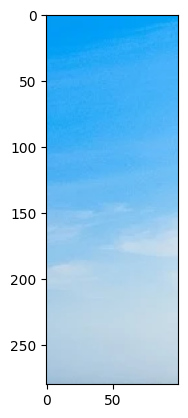

In [21]:
# Tomamos una muestra del cielo
sample = im_seg[0:280, 850:950,:]
plt.imshow(sample)
plt.show()

In [22]:
# Caracterizamos el color del suelo n el espacio RGB
color_mean, color_std = cv.meanStdDev(sample)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

[116.31110714285715, 191.21525000000003, 239.0534642857143]
[62.15517532344769, 18.101491343700516, 9.007058668392025]


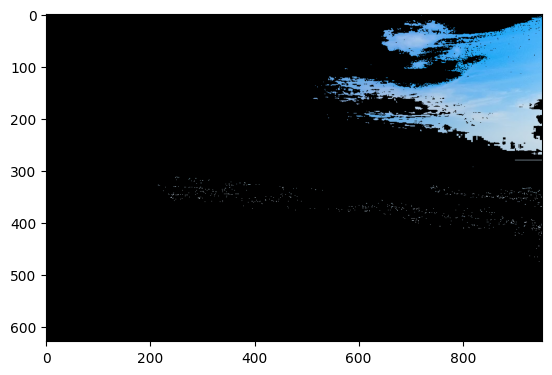

<function matplotlib.pyplot.show(close=None, block=None)>

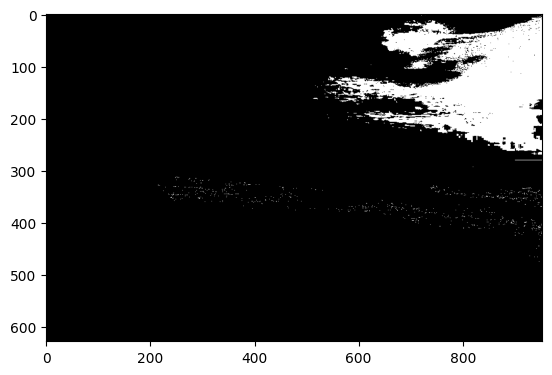

In [23]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 1.5 sigmas
n_sigma = 1.5
mask = cv.inRange(im_seg, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(im_seg, im_seg, mask=mask)

plt.figure(1)
plt.imshow(img_segmentada)
plt.show()

plt.figure(2)
plt.imshow(mask,cmap='gray')
plt.show

In [24]:
mask3 = mask.copy()

**Combinando varias máscaras**

Se ajustaron la ubicación de cada muestra y los valores de sigma de cada máscara para intentar segmentar la mayor parte del cielo sin incluir los reflejos del mar.

_(Se aprecia en el gráfico HSV que se encuentran muy próximos entre si)_

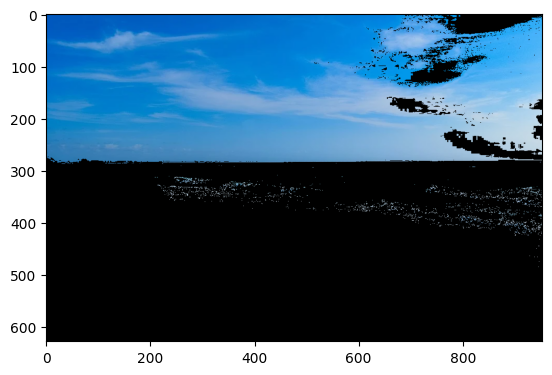

<function matplotlib.pyplot.show(close=None, block=None)>

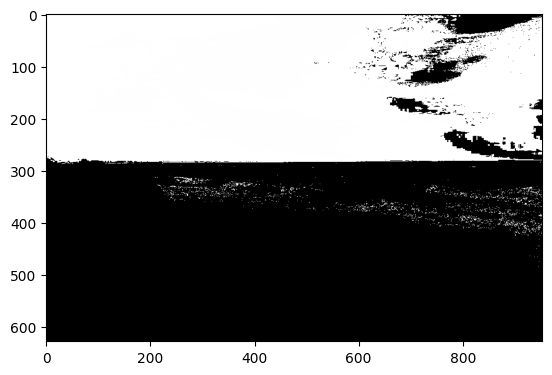

In [25]:
# Combinando ambas máscaras
mask = mask1 + mask2 + mask3
img_segmentada = cv.bitwise_and(im_seg, im_seg, mask=mask)

plt.figure(1)
plt.imshow(img_segmentada)
plt.show()

plt.figure(2)
plt.imshow(mask,cmap='gray')
plt.show

##### Segmentación del suelo

**Muestreo RGB**

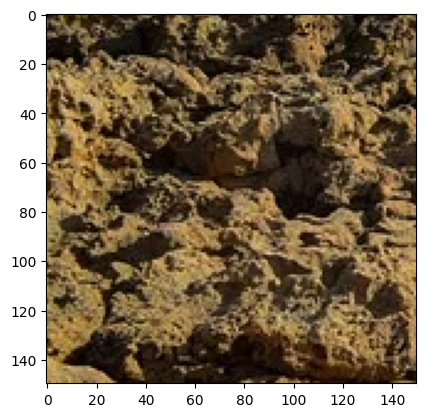

In [26]:
# Tomamos una muestra del suelo
sample = im_seg[400:550, 50:200,:]
plt.imshow(sample)
plt.show()

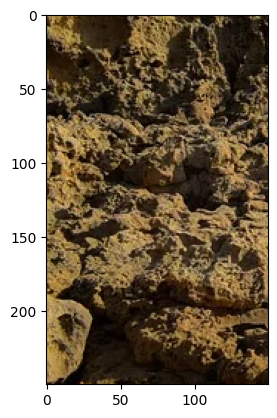

In [27]:
# Tomamos una muestra del suelo
sample = im_seg[350:600, 50:200,:]
plt.imshow(sample)
plt.show()

In [28]:
# Caracterizamos el color del suelo n el espacio RGB
color_mean, color_std = cv.meanStdDev(sample)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

[87.98896, 68.41042666666667, 41.35685333333333]
[56.25704564572392, 50.10458505251413, 37.100098324647185]


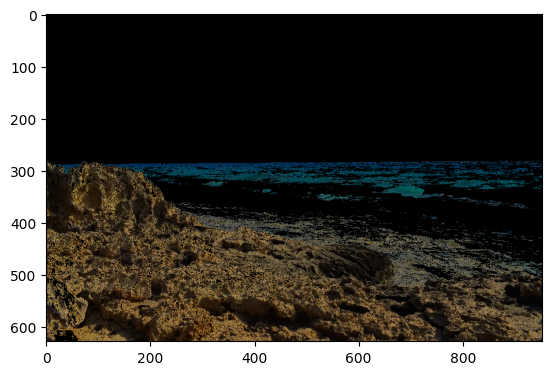

<function matplotlib.pyplot.show(close=None, block=None)>

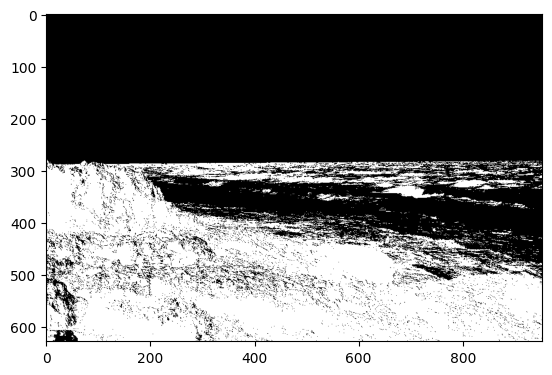

In [29]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 1.6 sigmas
n_sigma = 1.6
mask = cv.inRange(im_seg, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(im_seg, im_seg, mask=mask)

plt.figure(1)
plt.imshow(img_segmentada)
plt.show()

plt.figure(2)
plt.imshow(mask,cmap='gray')
plt.show

Puede verse que todo sigma por encima de 1 comienza a incluir pixeles del mar, por lo que la segmentación es incorrecta.

Una propuesta para solucionar esto es realizar el muestreo en el canal Hue de la imagen (por ser el que mejor discrimina el suelo).

**Muestreo HSV**

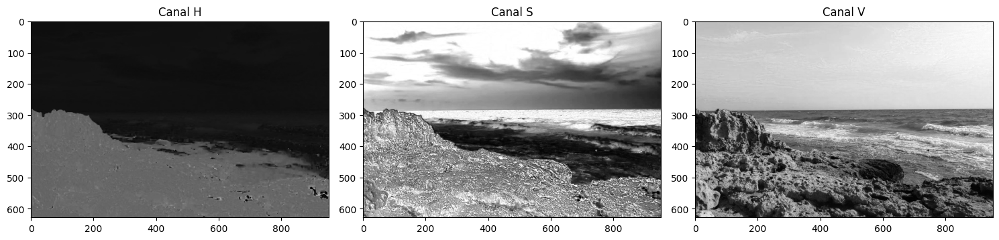

In [30]:
# Extraer los canales H, S, V
img_HSV = cv.cvtColor(im_seg, cv.COLOR_BGR2HSV)
H, S, V = cv.split(img_HSV)

# Mostrar cada canal individual
fig = plt.figure(figsize=(15, 5))

ax1=plt.subplot(131)
ax1.imshow(H, vmin=0, vmax=255,cmap='gray')
ax1.set_title('Canal H')

ax2=plt.subplot(132)
ax2.imshow(S, vmin=0, vmax=255,cmap='gray')
ax2.set_title('Canal S')

ax3=plt.subplot(133)
ax3.imshow(V, vmin=0, vmax=255,cmap='gray')
ax3.set_title('Canal V')

plt.tight_layout()
plt.show()

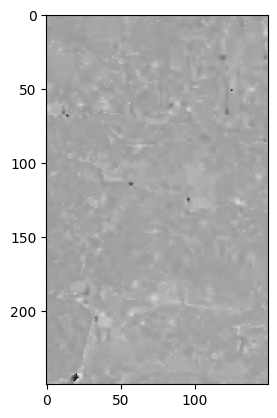

In [31]:
# Tomamos una muestra del suelo
sample = H[350:600, 50:200]
plt.imshow(sample, cmap='gray')
plt.show()

In [32]:
# Caracterizamos el color del suelo n el espacio RGB
color_mean, color_std = cv.meanStdDev(sample)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

[103.74914666666666]
[4.804867594966088]


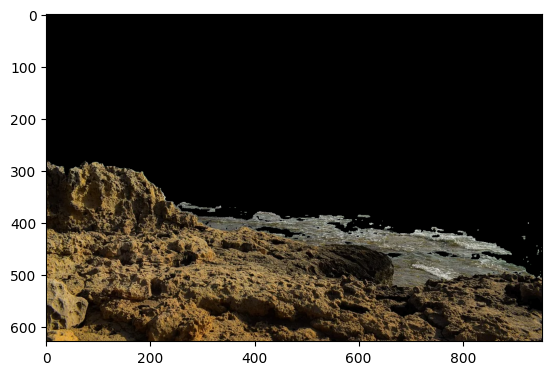

<function matplotlib.pyplot.show(close=None, block=None)>

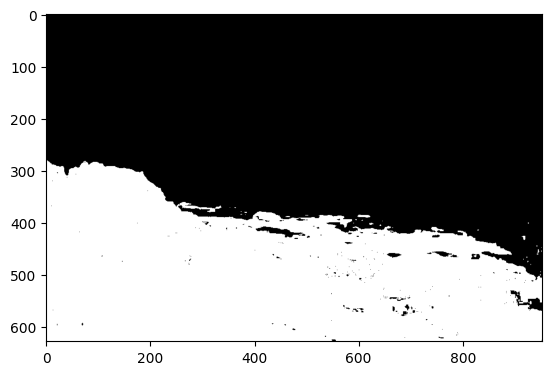

In [33]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 3 sigmas
n_sigma = 10
mask = cv.inRange(H, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(im_seg, im_seg, mask=mask)

plt.figure(1)
plt.imshow(img_segmentada)
plt.show()

plt.figure(2)
plt.imshow(mask,cmap='gray')
plt.show